In [ ]:
# 画 Natural Euler 的 Local Curve

In [1]:
from IPython.display import HTML

HTML('''<script src="https://cdnjs.cloudflare.com/ajax/libs/mathjax/2.7.7/MathJax.js?config=TeX-AMS-MML_SVG"></script>''')

In [2]:
import torch
import os
import sys
import numpy as np
import matplotlib.pyplot as plt
import warnings
import copy
import plotly.graph_objects as go

import torch.distributions as dist

from rectified_flow.utils import set_seed
from rectified_flow.utils import match_dim_with_data
from rectified_flow.datasets.toy_gmm import TwoPointGMM

from rectified_flow.rectified_flow import RectifiedFlow
from rectified_flow.models.toy_mlp import MLPVelocityConditioned, MLPVelocity

from rectified_flow.samplers import EulerSampler, CurvedEulerSampler
from rectified_flow.flow_components.interpolation_convertor import AffineInterpConverter
from rectified_flow.flow_components.interpolation_solver import AffineInterp

device = torch.device('cuda' if torch.cuda.is_available() else 'cpu')

In [3]:
from rectified_flow.datasets.toy_gmm import TwoPointGMM

set_seed(0)
n_samples = 50000
pi_0 = dist.MultivariateNormal(torch.tensor([-5., 0.], device=device), torch.eye(2, device=device)*0.09)
pi_1 = TwoPointGMM(x=3.37, y=3.69, std=0.3)
D0 = pi_0.sample([n_samples])
D1, labels = pi_1.sample_with_labels([n_samples])
labels.tolist()

from rectified_flow.flow_components.interpolation_solver import AffineInterp
from rectified_flow.utils import visualize_2d_trajectories_plotly

straight_interp = AffineInterp("straight")
spherical_interp = AffineInterp("spherical")

idx = torch.randperm(n_samples)[:1000]
x_0 = D0[idx]
x_1 = D1[idx]

print(x_0.shape)

straight_interp_list = []
spherical_interp_list = []

for t in np.linspace(0, 1, 50):
	x_t_straight, dot_x_t_straight = straight_interp.forward(x_0, x_1, t)
	x_t_spherical, dot_x_t_spherical = spherical_interp.forward(x_0, x_1, t)
	straight_interp_list.append(x_t_straight)
	spherical_interp_list.append(x_t_spherical)

visualize_2d_trajectories_plotly(
	trajectories_dict={"Straight interp": straight_interp_list, "Spherical interp": spherical_interp_list},
	D1_gt_samples=D1[:5000],
	num_trajectories=50,
	title="Interpolated Trajectories Visualization",
)

torch.Size([1000, 2])


In [4]:
def rf_trainer(rectified_flow, label = "loss", batch_size = 1024):
    model = rectified_flow.velocity_field
    optimizer = torch.optim.AdamW(model.parameters(), lr=1e-2)

    losses = []
    for step in range(10000):
        optimizer.zero_grad()
        x_0 = pi_0.sample([batch_size]).to(device)
        x_1 = pi_1.sample([batch_size]).to(device)

        loss = rectified_flow.get_loss(x_0, x_1)
        loss.backward()
        optimizer.step()
        losses.append(loss.item())

        if step % 1000 == 0:
            print(f"Epoch {step}, Loss: {loss.item()}")

    plt.plot(losses, label=label)
    plt.legend()

from rectified_flow.models.toy_mlp import MLPVelocity

set_seed(0)
straight_rf = RectifiedFlow(
    data_shape=(2,),
    velocity_field=MLPVelocity(2, hidden_sizes = [64, 128, 128, 128, 64]).to(device),
    interp=straight_interp,
    source_distribution=pi_0,
    device=device,
)

Epoch 0, Loss: 41.57231903076172
Epoch 1000, Loss: 0.8031991720199585
Epoch 2000, Loss: 0.6218521595001221
Epoch 3000, Loss: 0.7126383781433105
Epoch 4000, Loss: 0.7645730376243591
Epoch 5000, Loss: 0.8319770693778992
Epoch 6000, Loss: 0.5930448770523071
Epoch 7000, Loss: 0.711277186870575
Epoch 8000, Loss: 0.7627992630004883
Epoch 9000, Loss: 0.6805912256240845


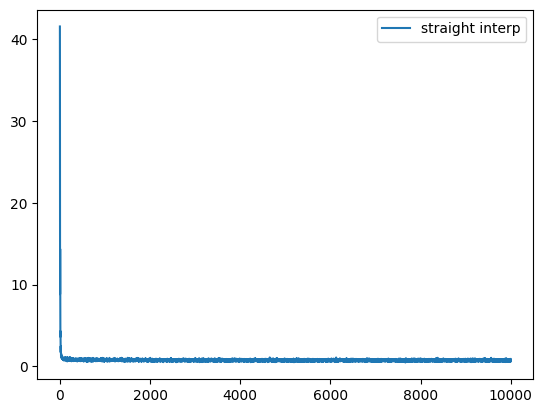

In [5]:
set_seed(0)
rf_trainer(rectified_flow=straight_rf, label="straight interp")

spherical_rf = AffineInterpConverter(straight_rf, AffineInterp("spherical")).transform_rectified_flow()

# set_seed(0)
# rf_trainer(rectified_flow=spherical_rf, label="straight interp")

In [45]:
# Both vanilla Euler sampler, huge difference in the trajectories

from rectified_flow.samplers import EulerSampler

num_samples = 300
num_steps = 100

euler_sampler_straight = EulerSampler(straight_rf, num_steps=num_steps)
euler_sampler_straight.sample_loop(seed=0, num_samples=num_samples)

euler_sampler_spherical = EulerSampler(spherical_rf, num_steps=num_steps)
euler_sampler_spherical.sample_loop(seed=0, num_samples=num_samples)

visualize_2d_trajectories_plotly(
    trajectories_dict={
        "straight rf": euler_sampler_straight.trajectories,
        "spherical rf": euler_sampler_spherical.trajectories,
	},
    D1_gt_samples=D1[:num_samples*3],
    num_trajectories=50,
    title="Euler Sampler, straight rf vs spherical rf",
)

In [31]:
def visualize_2d_trajectories_plotly_static(
    trajectories_dict: dict[str, list[torch.Tensor]],
    D1_gt_samples: torch.Tensor = None,
    num_trajectories: int = 50,
    markersize: int = 3,
    dimensions: list[int] = [0, 1],
    alpha_trajectories: float = 0.5,
    alpha_particles: float = 0.8,
    alpha_gt_points: float = 1.0,
    show_legend: bool = True,
    title: str = "2D Trajectories Visualization",
):
    import torch
    import numpy as np
    import plotly.graph_objects as go

    dim0, dim1 = dimensions

    # Convert ground truth samples to NumPy if provided
    if D1_gt_samples is not None:
        D1_gt_samples = D1_gt_samples.clone().to(torch.float32).cpu().detach().numpy()

    # Prepare color mapping for trajectories
    particle_colors = [
        "#1E90FF",
        "#FF69B4",
        "#7B68EE",
        "#FF8C00",
        "#32CD32",
        "#4169E1",
        "#FF4500",
        "#9932CC",
        "#ADFF2F",
        "#FFD700",
    ]

    trajectory_colors = [
        "#8ABDE5",
        "#E09CAF",
        "#B494E1",
        "#E5B680",
        "#82C9A1",
        "#92BCD5",
        "#E68FA2",
        "#A98FC8",
        "#E5C389",
        "#A0C696",
    ]

    marker_list = [
        "circle", "cross", "x", "square", "star", "diamond",
        "triangle-up", "triangle-down", "hexagram"
    ]

    trajectory_names = list(trajectories_dict.keys())
    colors = {}
    for i, name in enumerate(trajectory_names):
        colors[name] = {
            "particle_color": particle_colors[i % len(particle_colors)],
            "trajectory_color": trajectory_colors[i % len(trajectory_colors)],
            "marker": marker_list[i % len(marker_list)],
        }

    # Process trajectories and store data
    trajectory_data = {}
    max_time_steps = 0

    for trajectory_name, traj_list in trajectories_dict.items():
        # traj_list: List of trajectories, each shape [batch_size, dimension]
        xtraj_list = [
            traj.clone().to(torch.float32).detach().cpu().numpy() for traj in traj_list
        ]
        # xtraj shape: [time_steps, total_batch_size, dimension]
        xtraj = np.stack(xtraj_list)
        trajectory_data[trajectory_name] = xtraj
        max_time_steps = max(max_time_steps, xtraj.shape[0])

    # Create figure
    fig = go.Figure()

    # Collect all x and y values for setting axis range
    all_x, all_y = [], []

    # Plot ground truth samples (if any)
    if D1_gt_samples is not None:
        all_x.extend(D1_gt_samples[:, dim0])
        all_y.extend(D1_gt_samples[:, dim1])
        fig.add_trace(
            go.Scatter(
                x=D1_gt_samples[:, dim0],
                y=D1_gt_samples[:, dim1],
                mode="markers",
                name="GT Data",
                marker=dict(size=markersize, opacity=alpha_gt_points, color="red"),
                showlegend=False,
                hovertemplate='(%{x:.3f}, %{y:.3f})<extra>%{fullData.name}</extra>'
            )
        )
        
    fig.add_trace(
            go.Scatter(
                x=xtraj[0, :, dim0],
                y=xtraj[0, :, dim1],
                mode="markers",
                name="Source Dist",
                marker=dict(size=markersize, opacity=alpha_gt_points, color="blue"),
                showlegend=False,
                hovertemplate='(%{x:.3f}, %{y:.3f})<extra>%{fullData.name}</extra>'
            )
        )

    # Plot trajectories (lines) + collect all time-step points in one scatter
    for trajectory_name, xtraj in trajectory_data.items():
        particle_color = colors[trajectory_name]["particle_color"]
        trajectory_color = colors[trajectory_name]["trajectory_color"]
        marker_symbol = colors[trajectory_name]["marker"]

        time_steps = xtraj.shape[0]
        num_points = xtraj.shape[1]
        indices = np.arange(min(num_trajectories, num_points))

        # Accumulate for axis range
        all_x.extend(xtraj[:, :, dim0].ravel())
        all_y.extend(xtraj[:, :, dim1].ravel())

        # 1) Plot lines connecting each particle's trajectory over time
        #    (for the first `num_trajectories` particles)
        all_line_x = []
        all_line_y = []
        for i in indices:
            line_x = xtraj[:, i, dim0]
            line_y = xtraj[:, i, dim1]
            all_line_x.extend(line_x.tolist() + [np.nan])
            all_line_y.extend(line_y.tolist() + [np.nan])

        fig.add_trace(
            go.Scatter(
                x=all_line_x,
                y=all_line_y,
                mode="lines",
                name=f"{trajectory_name}",
                line=dict(dash="solid", color=trajectory_color, width=1.5),
                opacity=alpha_trajectories,
                showlegend=False,  # 这条线的 legend
                hoverinfo="skip",
            )
        )

        # 2) 将所有时刻的散点一次性画出
        #    （若只画其中部分粒子，可以再次用 indices；这里示例对所有粒子画点）
        for i in range(1, xtraj.shape[0]):
            x_all_points = xtraj[i, :, dim0].ravel()
            y_all_points = xtraj[i, :, dim1].ravel()
            fig.add_trace(
                go.Scatter(
                    x=x_all_points,
                    y=y_all_points,
                    mode="markers",
                    name=f"{trajectory_name}, step {i}",
                    marker=dict(
                        size=markersize,
                        color=particle_color,
                        symbol=marker_symbol
                    ),
                    opacity=alpha_particles,
                    showlegend=False,  # 如果不需要重复出现在 legend，就 False
                    hovertemplate='(%{x:.3f}, %{y:.3f})<extra>%{fullData.name}</extra>'
                )
            )

    # 现在已经把所有的轨迹（线）和各时刻的散点都静态画完

    # 计算上下限, 适当扩展
    min_x, max_x = np.min(all_x), np.max(all_x)
    min_y, max_y = np.min(all_y), np.max(all_y)
    delta_x = 0.02 * (max_x - min_x) if (max_x > min_x) else 1.0
    delta_y = 0.02 * (max_y - min_y) if (max_y > min_y) else 1.0

    fig.update_xaxes(
        range=[-5.8, 4.5],
        showgrid=True,
        gridcolor="white",
        gridwidth=1,
        griddash="dot",
        showticklabels=False,
        showline=False,
        zeroline=False,
        mirror=False,
        dtick=2.0,
    )

    fig.update_yaxes(
        range=[-4.8, 4.8],
        showgrid=True,
        gridcolor="white",
        gridwidth=1,
        griddash="dot",
        showticklabels=False,
        showline=False,
        zeroline=False,
        mirror=False,
        dtick=1.0,
    )

    # 去掉所有 slider、frames、按钮，仅保留静态可视化
    fig.update_layout(
        margin=dict(l=10, r=10, t=10, b=10),
        showlegend=show_legend,
        # height=600,
        # width=900,
        autosize=True,
    )

    # 静态展示
    fig.show()

    # 可写出 HTML
    fig.write_html(
        "./vanilla_euler.html",
        full_html=True,
        include_plotlyjs="cdn"
    )

In [72]:
# Try different num_steps, e.g. [5, 10, 50, 100, 500]
num_samples = 50
num_steps = 4

euler_sampler_spherical = EulerSampler(spherical_rf, num_steps=num_steps)
euler_sampler_spherical.sample_loop(seed=0, num_samples=num_samples)

natural_euler_sampler_spherical = CurvedEulerSampler(spherical_rf, num_steps=num_steps)
natural_euler_sampler_spherical.sample_loop(seed=0, num_samples=num_samples)

# Straight Converted to Spherical   v.s.   Original Straight RF
# zoom in to see they are really close
visualize_2d_trajectories_plotly_static(
	trajectories_dict={
        "Vanilla Euler": euler_sampler_spherical.trajectories, 
        # "Natural Euler": natural_euler_sampler_spherical.trajectories
    },
	D1_gt_samples=D1[:1000],
	num_trajectories=50,
)

In [73]:
print(euler_sampler_spherical.time_points)

print(natural_euler_sampler_spherical.time_grid)

[0.0, 0.25, 0.5, 0.75, 1.0]
[0.0, 0.25, 0.5, 0.75, 1.0]


In [76]:
all_traj_list = []

for i in range(len(natural_euler_sampler_spherical.trajectories) - 1):
    t = natural_euler_sampler_spherical.time_points[i]
    x_t = natural_euler_sampler_spherical.trajectories[i] # shape: [B, 2]
    v_t = spherical_rf.get_velocity(x_t, t)
    
    interp = spherical_rf.interp.solve(t=t, x_t=x_t, dot_x_t=v_t)
    
    x_0 = interp.x_0
    x_1 = interp.x_1
    
    all_traj_list.append(x_t)
    
    for t in np.linspace(natural_euler_sampler_spherical.time_points[i], natural_euler_sampler_spherical.time_points[i + 1], 50):
        x_t, _ = spherical_interp.forward(x_0, x_1, t)
        all_traj_list.append(x_t)
    
print(len(all_traj_list))

all_traj = [
	traj.clone().to(torch.float32).detach().cpu().numpy() for traj in all_traj_list
]

all_traj = np.stack(all_traj)

204


In [81]:
D1_gt_samples = D1[:1000].clone().to(torch.float32).cpu().detach().numpy()

particle_colors = [
	"#1E90FF",
	"#FF69B4",
]

trajectory_colors = [
	"#8ABDE5",
	"#E09CAF",
]

marker_list = [
	"circle", "cross",
]

# Process trajectories and store data
trajectory_data = {}
max_time_steps = 0

# traj_list: List of trajectories, each shape [batch_size, dimension]
xtraj_list = [
	traj.clone().to(torch.float32).detach().cpu().numpy() for traj in all_traj_list
]

x_t_list = [
	traj.clone().to(torch.float32).detach().cpu().numpy() for traj in natural_euler_sampler_spherical.trajectories
]
# xtraj shape: [time_steps, total_batch_size, dimension]

xtraj = np.stack(xtraj_list)
xts = np.stack(x_t_list)
print(f"xtraj_list: {xtraj.shape})")
print(f"x_t_list: {xts.shape})")

max_time_steps = max(max_time_steps, xtraj.shape[0])

# Create figure
fig = go.Figure()

# Plot ground truth samples (if any)
if D1_gt_samples is not None:
	fig.add_trace(
		go.Scatter(
			x=D1_gt_samples[:, 0],
			y=D1_gt_samples[:, 1],
			mode="markers",
			name="GT Data",
			marker=dict(size=3, opacity=0.8, color="red"),
			showlegend=False,
			hovertemplate='(%{x:.3f}, %{y:.3f})<extra>%{fullData.name}</extra>'
		)
	)
	
fig.add_trace(
		go.Scatter(
			x=xtraj[0, :, 0],
			y=xtraj[0, :, 1],
			mode="markers",
			name="Source Dist",
			marker=dict(size=3, opacity=0.8, color="blue"),
			showlegend=False,
			hovertemplate='(%{x:.3f}, %{y:.3f})<extra>%{fullData.name}</extra>'
		)
	)

# Plot trajectories (lines) + collect all time-step points in one scatter
particle_color = particle_colors[0]
trajectory_color = trajectory_colors[0]
marker_symbol = marker_list[0]

time_steps = xtraj.shape[0]
num_points = xtraj.shape[1]
indices = np.arange(min(100, num_points))

# 1) Plot lines connecting each particle's trajectory over time
#    (for the first `num_trajectories` particles)
all_line_x = []
all_line_y = []
for i in indices:
	line_x = xtraj[:, i, 0]
	line_y = xtraj[:, i, 1]
	all_line_x.extend(line_x.tolist() + [np.nan])
	all_line_y.extend(line_y.tolist() + [np.nan])

fig.add_trace(
	go.Scatter(
		x=all_line_x,
		y=all_line_y,
		mode="lines",
		name=f"Natural Euler",
		line=dict(dash="solid", color=trajectory_color, width=1.5),
		opacity=0.5,
		showlegend=False,  # 这条线的 legend
		hoverinfo="skip",
	)
)

# 2) 将所有时刻的散点一次性画出
#    （若只画其中部分粒子，可以再次用 indices；这里示例对所有粒子画点）
for i in range(1, xts.shape[0]):
	x_all_points = xts[i, :, 0].ravel()
	y_all_points = xts[i, :, 1].ravel()
	fig.add_trace(
		go.Scatter(
			x=x_all_points,
			y=y_all_points,
			mode="markers",
			name=f"Natural Euler, step {i}",
			marker=dict(
				size=3,
				color=particle_color,
				symbol=marker_symbol
			),
			opacity=0.8,
			showlegend=False,  # 如果不需要重复出现在 legend，就 False
			hovertemplate='(%{x:.3f}, %{y:.3f})<extra>%{fullData.name}</extra>'
		)
	)

# 现在已经把所有的轨迹（线）和各时刻的散点都静态画完

fig.update_xaxes(
	range=[-5.8, 4.5],
	showgrid=True,
	gridcolor="white",
	gridwidth=1,
	griddash="dot",
	showticklabels=False,
	showline=False,
	zeroline=False,
	mirror=False,
	dtick=2.0,
)

fig.update_yaxes(
	range=[-4.8, 4.8],
	showgrid=True,
	gridcolor="white",
	gridwidth=1,
	griddash="dot",
	showticklabels=False,
	showline=False,
	zeroline=False,
	mirror=False,
	dtick=1.0,
)

# 去掉所有 slider、frames、按钮，仅保留静态可视化
fig.update_layout(
	margin=dict(l=10, r=10, t=10, b=10),
	showlegend=False,
	# height=600,
	# width=900,
	autosize=True,
)

# 静态展示
fig.show()

# 可写出 HTML
fig.write_html(
	"./natural_euler.html",
	full_html=True,
	include_plotlyjs="cdn"
)

xtraj_list: (204, 50, 2))
x_t_list: (5, 50, 2))


In [64]:
# Matched time grid, both natural euler samplers, exactly the same

def convert_time(t, affine_interp):
    return [affine_interp.alpha(t) / (affine_interp.alpha(t) + affine_interp.beta(t)) for t in t]

converted_time_grid = convert_time(natural_euler_sampler_spherical.time_grid, spherical_interp)
print(converted_time_grid)

natural_euler_sampler_straight = CurvedEulerSampler(straight_rf, time_grid=converted_time_grid)
natural_euler_sampler_straight.sample_loop(seed=0, num_samples=num_samples)

visualize_2d_trajectories_plotly(
    trajectories_dict={
        "straight rf": natural_euler_sampler_straight.trajectories,
        "spherical rf": natural_euler_sampler_spherical.trajectories,
	},
    D1_gt_samples=D1[:num_samples*3],
    num_trajectories=50,
    title="Natural Euler Sampler, straight rf vs spherical rf, matched time gird",
)

[tensor(0.), tensor(0.2929), tensor(0.5000), tensor(0.7071), tensor(1.0000)]


In [70]:
def visualize_2d_trajectories_plotly_curved(
    trajectories_dict: dict[str, list[torch.Tensor]],
    D1_gt_samples: torch.Tensor = None,
    num_trajectories: int = 50,
    markersize: int = 3,
    dimensions: list[int] = [0, 1],
    alpha_trajectories: float = 0.5,
    alpha_particles: float = 0.8,
    alpha_gt_points: float = 1.0,
    show_legend: bool = True,
    title: str = "2D Trajectories Visualization",
):
    import plotly.graph_objects as go

    dim0, dim1 = dimensions

    # Convert ground truth samples to NumPy if provided
    if D1_gt_samples is not None:
        D1_gt_samples = D1_gt_samples.clone().to(torch.float32).cpu().detach().numpy()

    # Prepare color mapping for trajectories
    particle_colors = [
        "#1E90FF",
        "#FF69B4",
        "#7B68EE",
        "#FF8C00",
        "#32CD32",
        "#4169E1",
        "#FF4500",
        "#9932CC",
        "#ADFF2F",
        "#FFD700",
    ]

    trajectory_colors = [
        "#8ABDE5",
        "#E09CAF",
        "#B494E1",
        "#E5B680",
        "#82C9A1",
        "#92BCD5",
        "#E68FA2",
        "#A98FC8",
        "#E5C389",
        "#A0C696",
    ]

    marker_list = [
        "circle", "cross", "x", "square", "star", "diamond",  
        "triangle-up", "triangle-down", "hexagram"
    ]

    trajectory_names = list(trajectories_dict.keys())
    colors = {}
    for i, name in enumerate(trajectory_names):
        colors[name] = {
            "particle_color": particle_colors[i % len(particle_colors)],
            "trajectory_color": trajectory_colors[i % len(trajectory_colors)],
            "marker": marker_list[i % len(marker_list)],
        }

    # Process trajectories and store data
    trajectory_data = {}
    max_time_steps = 0

    for trajectory_name, traj_list in trajectories_dict.items():
        # traj_list: List of trajectories, each of shape [batch_size, dimension]
        xtraj_list = [
            traj.clone().to(torch.float32).detach().cpu().numpy() for traj in traj_list
        ]
        xtraj = np.stack(xtraj_list)  # Shape: [time_steps, total_batch_size, dimension]
        trajectory_data[trajectory_name] = xtraj
        max_time_steps = max(max_time_steps, xtraj.shape[0])

    # Create figure
    fig = go.Figure()

    # Collect all x and y values
    all_x, all_y = [], []

    # Plot ground truth samples
    if D1_gt_samples is not None:
        all_x.extend(D1_gt_samples[:, dim0])
        all_y.extend(D1_gt_samples[:, dim1])
        fig.add_trace(
            go.Scatter(
                x=D1_gt_samples[:, dim0],
                y=D1_gt_samples[:, dim1],
                mode="markers",
                name="GT data",
                marker=dict(size=markersize, opacity=alpha_gt_points, color="red"),
                showlegend=show_legend,
                hovertemplate='(%{x:.3f}, %{y:.3f})<extra>%{fullData.name}</extra>'
            )
        )

    particle_trace_indices = {}
    particle_traces_info = []
    current_trace_index = len(fig.data)

    for trajectory_name, xtraj in trajectory_data.items():
        all_x.extend(xtraj[:, :, dim0].ravel())
        all_y.extend(xtraj[:, :, dim1].ravel())

        particle_color = colors[trajectory_name]["particle_color"]
        trajectory_color = colors[trajectory_name]["trajectory_color"]
        marker_symbol = colors[trajectory_name]["marker"]
        time_steps = xtraj.shape[0]
        num_points = xtraj.shape[1]
        indices = np.arange(min(num_trajectories, num_points))

        # Plot all trajectories as single trace
        all_line_x = []
        all_line_y = []

        if trajectory_name == "Straight Natural Euler":
            for i in indices:
                line_x = xtraj[:, i, dim0]
                line_y = xtraj[:, i, dim1]
                all_line_x.extend(line_x.tolist() + [np.nan])
                all_line_y.extend(line_y.tolist() + [np.nan])
        elif trajectory_name == "Spherical Natural Euler":
            for i in range(all_traj.shape[1]):
                line_x = all_traj[:, i, dim0]
                line_y = all_traj[:, i, dim1]
                all_line_x.extend(line_x.tolist() + [np.nan])
                all_line_y.extend(line_y.tolist() + [np.nan])

        fig.add_trace(
            go.Scatter(
                x=all_line_x,
                y=all_line_y,
                mode="lines",
                name=f"{trajectory_name}",
                line=dict(dash="solid", color=trajectory_color, width=1.5),
                opacity=alpha_trajectories,
                showlegend=True,
                # hovertemplate='(%{x:.3f}, %{y:.3f})<extra>%{fullData.name} traj</extra>'
                hoverinfo="skip",
            )
        )
        current_trace_index += 1

        # Plot initial points from trajectories
        fig.add_trace(
            go.Scatter(
                x=xtraj[0, :, dim0],
                y=xtraj[0, :, dim1],
                mode="markers",
                name=f"{trajectory_name} source dist",
                marker=dict(
                    size=markersize, 
                    opacity=alpha_gt_points, 
                    color="blue", 
                    symbol=marker_symbol
                ),
                showlegend=False,
                hovertemplate='(%{x:.3f}, %{y:.3f})<extra>%{fullData.name}</extra>'
            )
        )
        current_trace_index += 1

        # Collect particle traces info
        particle_traces_info.append(
            {
                "trajectory_name": trajectory_name,
                "x": xtraj[0, :, dim0],
                "y": xtraj[0, :, dim1],
                "particle_color": particle_color,
                "trace_index": None,
            }
        )

    # Plot after all trajectories
    for info in particle_traces_info:
        fig.add_trace(
            go.Scatter(
                x=info["x"],
                y=info["y"],
                mode="markers",
                name=f"{info['trajectory_name']}",
                marker=dict(size=markersize, color=info["particle_color"]),
                showlegend=False,
                hovertemplate='(%{x:.3f}, %{y:.3f})<extra>%{fullData.name}</extra>'
            )
        )
        info["trace_index"] = current_trace_index
        particle_trace_indices[info["trajectory_name"]] = current_trace_index
        current_trace_index += 1

    # Create frames
    frames = []
    for t in range(max_time_steps):
        frame_data = []
        frame_trace_indices = []
        for trajectory_name, xtraj in trajectory_data.items():
            particle_color = colors[trajectory_name]["particle_color"]
            marker_symbol = colors[trajectory_name]["marker"]

            if t >= xtraj.shape[0]:
                continue

            x = xtraj[t, :, dim0]
            y = xtraj[t, :, dim1]
            trace_index = particle_trace_indices[trajectory_name]

            frame_data.append(
                go.Scatter(
                    x=x,
                    y=y,
                    mode="markers",
                    marker=dict(
                        size=markersize, 
                        color=particle_color,
                        symbol=marker_symbol,
                    ),
                    opacity=alpha_particles,
                    name=f"{trajectory_name}",
                    showlegend=False,
                    hovertemplate='(%{x:.3f}, %{y:.3f})<extra>%{fullData.name}</extra>'
                )
            )
            frame_trace_indices.append(trace_index)

        frames.append(
            go.Frame(data=frame_data, name=str(t), traces=frame_trace_indices)
        )

    # Create slider steps
    slider_steps = []
    for t in range(max_time_steps):
        step = dict(
            method="animate",
            args=[
                [str(t)],
                dict(
                    mode="immediate",
                    frame=dict(duration=0, redraw=True),
                    transition=dict(duration=0),
                ),
            ],
            label=str(t),
        )
        slider_steps.append(step)

    # Create sliders
    sliders = [
        dict(
            active=0,
            currentvalue={"prefix": "Step: "},
            pad={"t": 20},
            steps=slider_steps,
        )
    ]

    min_x, max_x = np.min(all_x), np.max(all_x)
    min_y, max_y = np.min(all_y), np.max(all_y)
    delta_x = 0.02 * (max_x - min_x) 
    delta_y = 0.02 * (max_y - min_y)

    fig.update_xaxes(
        range=[min_x - delta_x, max_x + delta_x],
        showgrid=True,             
        gridcolor="white",         
        gridwidth=1,              
        griddash="dot",          
        showticklabels=False,      
        showline=False,            
        zeroline=False,           
        mirror=False,
        dtick=2.0,               
    )

    fig.update_yaxes(
        range=[min_y - delta_y, max_y + delta_y],
        showgrid=True,
        gridcolor="white",
        gridwidth=1,
        griddash="dot",
        showticklabels=False,
        showline=False,
        zeroline=False,
        mirror=False,
        dtick=1.0,
    )

    # Update figure layout
    fig.update_layout(
        sliders=sliders,
        updatemenus=[
            {
                "type": "buttons",
                "x": 0.5,
                "xanchor": "center",
                "y": -0.05,
                "yanchor": "middle",
                "pad": {"t": 10, "b": 10},
                "buttons": [
                    {
                        "label": "Play",
                        "method": "animate",
                        "args": [
                            None,
                            {
                                "frame": {"duration": 500, "redraw": False},
                                "transition": {"duration": 300, "easing": "quadratic-in-out"},
                                "fromcurrent": True,
                                "mode": "immediate",
                                "loop": True,
                            },
                        ],
                    },
                ],
            }
        ],
        title=dict(
            text=title,
            x=0.03,
            xanchor="left",
        ),
        margin=dict(l=20, r=20, t=50, b=20),
        showlegend=show_legend,
        # height=600,
        # width=900,
        autosize=True,
    )

    # Add frames
    fig.frames = frames

    # Show figure
    fig.show()

    fig.write_html(
        "./myplot.html",
        full_html=True,
        include_plotlyjs="cdn"
    )
    
visualize_2d_trajectories_plotly_curved(
    trajectories_dict={
        "Straight Natural Euler": natural_euler_sampler_straight.trajectories,
        "Spherical Natural Euler": natural_euler_sampler_spherical.trajectories,
	},
    D1_gt_samples=D1[:num_samples*3],
    num_trajectories=50,
    title="Natural Euler: Straight and Spherical",
)